# **W11 Sankey & Network Diagrams**

**<h1 id="1-桑基图-sankey-diagram">1. 桑基图 Sankey Diagram</h>**

**<h2 id="1.1-什么是桑基图">1.1 什么是桑基图</h2>**

**桑基图（Sankey diagram）** ，即桑基能量分流图，也叫桑基能量平衡图。它是一种特定类型的流程图，概述图中延伸的分支的宽度对应数据流量的大小，通常用于展示能量、金钱或材料等数据的转移。因 1898 年 Matthew Henry Phineas Riall Sankey 绘制的“蒸汽机的能源效率图”而闻名，此后便以其名字命名为“桑基图” [(百度百科)](https://baike.baidu.com/item/%E6%A1%91%E5%9F%BA%E5%9B%BE/10773057)。

桑基图的主要组成部分是 **<span style='color:FireBrick'>节点 (node)</span>** 和 **<span style='color:FireBrick'>链接 (link)</span>** 。节点代表流程中的不同阶段或实体，而两个节点之间的链接代表资源在节点之间的流动。链接通常是有向的，从 **源节点（sorce node）** 指向 **目标节点（target node）**，其 **方向** 代表资源流动的方向。而链接的 **宽度** 代表资源的 **<span style='color:FireBrick'>流量大小</span>**：链接越宽，流量越大。  

除此之外，我们还可以通过改变 颜色 等方式来展示 流程的不同阶段 或 节点的不同类别。

**桑基图主要用于展示资源的流动，如电力、能源、金钱的流动，它可以直观地展示资源的流动、分类、比例、方向、汇聚/发散的趋势等。** 其中，起始流量和结束流量是相同的，每个 **阶段** 的分支宽度总和是相等的，保持能量守恒。  

**例1：** 如下图 Figure 1.1-1 展示了打工人月度开销的流向，从最左链接 “总费用” 节点流向右链接各个具体项目的节点。

![Alternative Text][1733162070682]

[1733162070682]: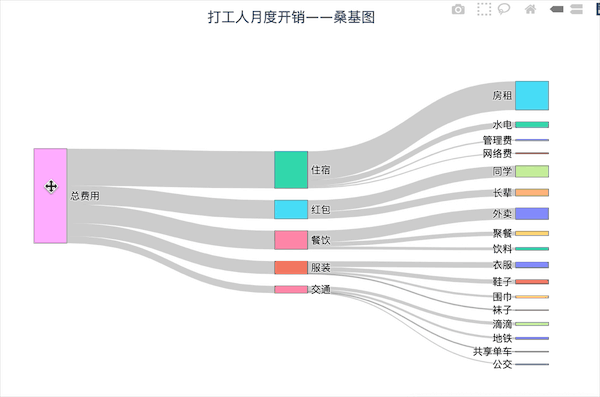

*Figure 1.1-1 打工人月度开销桑基图 [（Source: Peter, 2021）](https://blog.csdn.net/qq_25443541/article/details/118278484)*

**例2：** 下图 Figure 1.1-2 展示了一个关于家中电能流向的桑基图。节点分为三个阶段：最左链接的节点代表家中的所有电能，中间一列的三个节点代表家中的不同房间，右链接一列的节点代表最终流向的电器。电能从最左侧流向最右侧，其中链接的宽度代表电能流量的大小，不同颜色代表不同的电器。

![Alternative Text][1733155482417]

[1733155482417]: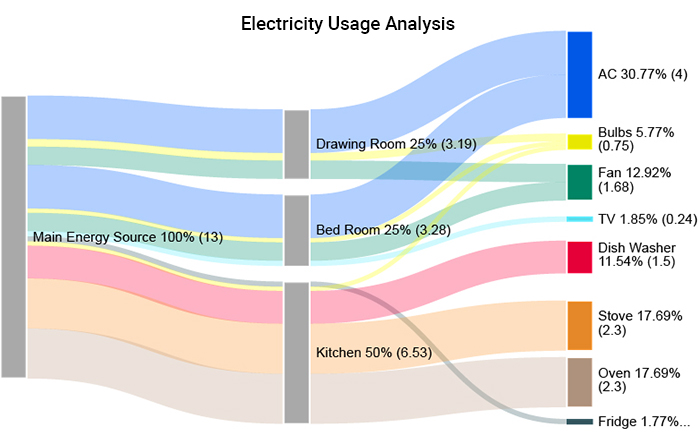

*Figure 1.1-2 家中电力流向桑基图 [(Source: PPCexpo, Example #2)](https://ppcexpo.com/blog/energy-flow-diagram)*

**例3：** 再如下图 Figure 1.1-3 展示了某购物网站订单的分类：最左侧是该购物网站的所有订单，第二列是产品的大类，第三列是产品细分类，最右链接一列是品牌。其中链接的宽度代表了订单的数量，不同颜色代表了不同商品大类。

![Alternative Text][1733154979710]

[1733154979710]: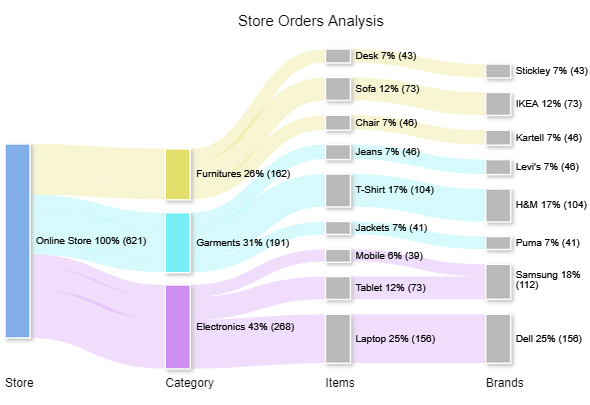

*Figure 1.1-3. 购物网站订单分类桑基图 [(Source: ChartExpo, Example #5)](https://chartexpo.com/blog/sankey-diagram-in-excel#)*

**<h2 id="1.2-plotly-graph-object">1.2 Plotly Graph Object</h2>**

在 W09-10 的学习中，我们引入了 plotly 库，但是只使用了其中的 `plotly.express` 模块，这是一个更高级的 plotly 接口，可以通过简易的函数绘制基础的图表。但是为了绘制更复杂的桑基图，我们需要从另一个更低级的接口 `plotly.graph_objects`  plotly 库。

>**低级接口（Low-Level Interface）**  
>低级接口是一种底层的接口，提供了一组基本的函数或方法，用于直接操作底层资源或数据结构。低级接口通常需要用户编写更多底层代码。
>
>**高级接口（High-Level Interface）**  
>高级接口是一种抽象的接口，提供了更简洁易用的函数或方法，用于完成特定的任务。高级接口通常跳过了底层代码，只提供高度整合后的函数或方法，方便用户编写。
>
>**例：**  
>通过 `import matplotlib.pyplot as plt` 来直接引入 Matplotlib 的高级接口，可以直接使用 `plt.函数名()` 轻松画出基础图表。  
>但是如果想要调用其他底层函数，比如：想要创建一个轴，就必须通过 `import matplotlib as mpl` 引入一个低级接口，才能调用函数 `mpl.axes.Axes(略)` 用于创建轴。  
>然而，如果只引入了低级接口，则需要写更多的代码才能使用高级接口的函数。  
>比如：通过高级接口只需要写 `plt.hist(略)` 即可绘制直方图；但通过低级接口只需要写 `mpl.pyplot.hist(略)`。  

In [2]:
# 通过低级接口 plotly.graph_objects 接入 plotly 库，命名为 go
import plotly.graph_objects as go  

**<h2 id="1.3-函数-function-和类-class">1.3 函数 (function) 和类 (class)</h2>**

**我们将要使用 `go.Sankey()` 储存想要绘制的桑基图的基本信息，再用 `go.Figure()` 将其绘制出来。**  

严格来说，`go.Sankey()` 不是一个函数，而是一个用于创建 Sankey 图表对象的构造函数。这是一种特殊的函数，专门用于创建和初始化对象，而普通函数则用于更一般的目的。

**具体来说：**

>go.Sankey 是 `plotly.graph_objects` 模块中的一个类 (class)。  
>当我们调用 `go.Sankey()` 时,它会返回一个储存 Sankey 图表信息的对象。  
>我们可以通过传递参数来配置这个 Sankey 对象的属性，如节点 (`node`)、链接 (`link`) 等。  
>这个 Sankey 对象可以被添加到 Figure 对象中，然后绘制出来。    

`go.Figure()` 与之类似，用于创建 Figure 对象，并将 Sankey 图表添加到其中。此外，Python 内置函数 `str()`（用于创建字符串对象）和 `list()`（用于创建列表对象） 等，也都是一个类 (class)，并有自己的参数来配置其属性 (property)。

**Python 中的术语对应关系如下：**

>**函数 (function) - 参数 (parameter)**  
>* 函数是独立的操作。例如：`print()` 是 Python 的内置函数，用于输出内容；`pd.read_csv()` 是 Pandas 库中的一个函数，用来读取 csv 文件，并返回一个 DataFrame 对象；`pd.read_csv(encoding='utf-8')` 中的 encoding 是 `.read_csv()` 方法的一个参数，表示 csv 文件的字符编码。
>
>**对象 (object) - 方法 (method) - 参数 (parameter)** 
>* 方法是针对具体对象的操作。例如：`df.sample()` 是一个 DataFrame 对象的方法，用来返回对象的一个随机样本；`df.sample(size=10)` 中的 size 是 `.sample()` 方法的一个参数，表示返回的行数。
>
>**类 (class) - 属性 (property)**  
>* 例如：`go.Sankey()` 是一个类，也是用来创建 Sankey 图表对象的构造函数。`node` 和 `link` 是 Sankey 图表对象类 的两个属性。
>
>**对象 (object) - 属性 (attribute)**  
>* 例如：`df.columns` 是一个特定 DataFrame 对象的属性，表示 DataFrame 对象的列标签。运行 `print(df.columns)` 后将输出 df 的所有列标签。
>
>**<span style='color:FireBrick'>注意：pd 和 go 是库接口，而 df 是一个具体对象。</span>**

**<h2 id="1.4-字典-dictionary">1.4 字典 (dictionary)</h2>**

**括号的英文：**

>圆括号/小括号 ( )：brackets / round brackets / smooth brackets (老师PPT里的叫法) / parentheses     
>方括号/中括号 [ ]：square brackets  
>花括号/大括号 { }：curly brackets  

**三种创建字典的方式：**

In [3]:
# 三种创建字典的方式

#【法1】基本方式
d1 = {'a':1,'b':2,'c':3}  
    # 其中 'a','b','c' 作为关键字 (key)；1,2,3 作为值 (value)。

#【法2】不用写引号
d2 = dict(a=1,b=2,c=3)

#【法3】分别定义关键字和值
keys = ['a','b','c']
values = [1,2,3]
d3 = dict(zip(keys,values))

print(d1)
print(d2)
print(d3)

{'a': 1, 'b': 2, 'c': 3}
{'a': 1, 'b': 2, 'c': 3}
{'a': 1, 'b': 2, 'c': 3}


**字典和列表的主要区别：**

* 列表是有序的，元素可以重复；而字典是无序的，元素不可以重复（关键字不可重复，值可以）。
* 列表中的元素只能靠元素所在位置（数字）来查找；而字典中的元素可以按关键字查找，关键字更好记。


In [4]:
# 列表 & 字典 例子：动物和叫声
animal_with_sound = {'猫':'喵喵喵','狗':'汪汪汪','鸭':'嘎嘎嘎'} # 字典
sound = ['喵喵喵','汪汪汪','嘎嘎嘎'] # 列表

In [5]:
sound[0]  # 列表中的元素只能通过其 位置序号（=索引=index, 复数 indices）来查找，从 0 开始。

'喵喵喵'

In [6]:
animal_with_sound['猫']  # 字典中的的元素可以按关键字查找，关键字更好记。

'喵喵喵'

**<h2 id="绘制桑基图">1.5 绘制桑基图</h2>**

**相关链接：**  

>**[【Plotly 官方教程】桑基图绘制基础教程](https://plotly.com/python/sankey-diagram/)**   
>**[【Plotly 说明文档】plotly.graph_object.Sankey( )](https://plotly.com/python-api-reference/generated/plotly.graph_objects.Sankey.html#plotly-graph-objs-sankey)**

**为了便于理解，我们在此处把 `go.Sankey()` 当成一个函数，并称呼其中多层嵌套的参数为：外参数、一级内参数、二级内参数等。**  

**按照如下步骤，首先使用 `go.Sankey()` 创建一个储存桑基图信息的对象：**

In [7]:
# go.Sankey() 函数的参数设置

sankey_data = go.Sankey(   # 定义 sankey_data 变量

  #【外参数1：node 节点】
    node = dict(

      #【一级内参数】
        label = ['A1','A2','B1','B2','C1','C2'],  
            #【label】节点标签：列表。
            # 此处命名使用的 A/B/C 代表三个不同阶段；数字代表同一阶段内的不同节点。

        color = ['yellow', 'yellow', 'tomato', 'tomato', 'cornflowerblue', 'cornflowerblue'],      
            #【color】节点颜色：字符串 或 列表；列表应和 label 列表中元素数量相同；
            # 只写一个字符串则所有节点共用一个颜色；不写默认为黑色。

        pad = 30,   #【pad】节点之间的垂直间距：数值（单位为像素）。
        thickness = 20,   #【thickness】节点的粗细：数值（单位为像素）。

        line = dict(   #【line】节点的外框线：⭕字典。
            
          #【二级内参数】
            color = 'black',  #【color】外框线的颜色：字符串 或 列表；和上面的节点颜色参数类似。
            width = 5,   #【width】外框线的宽度。
            )
    ),

  #【外参数2：link 链接】
    link = dict(
        
        source = [0, 1, 0, 2, 3, 3], 
            #【source】源节点：数字列表。
            # 填写 label 中每个节点名称对应的 ⭕位置序号（=索引=indices），
            # 此处对应了 ['A1','A2','A1','B1','B2','B2'] 这些节点标签。

        target = [2, 3, 3, 4, 4, 5],
            #【target】目标节点：数字列表。
            # 填写 label 中每个节点名称对应的 ⭕位置序号（=索引=indices），
            # 此处对应了 ['B1','B2','B2','C1','C2','C2']。

        value = [8, 4, 2, 8, 4, 2],
            #【value】链接流量值：数字列表。
            # 与 source 和 target 列表中元素数量对应。

        color = ['sandybrown', 'sandybrown', 'sandybrown', 'thistle', 'thistle', 'thistle'],
            #【color】链接颜色：字符串 或 列表；颜色数量应当和链接数量对应。

        arrowlen = 15 
            #【arrowlen】链接箭头的长度（从源节点指向目标节点）。默认为 0，表示没有箭头。
    )
)

print(type(sankey_data),'\n')  # 查看 sankey_data 变量的数据类型。'\n' 是换行符。
print(sankey_data)  
    # sankey_data 变量是一个包含了 Sankey 图所需的数据的 "Sankey 对象"，其形式类似 Python 字典。
    # 其参数以字典形式进行了多重嵌套。

<class 'plotly.graph_objs._sankey.Sankey'> 

Sankey({
    'link': {'arrowlen': 15,
             'color': [sandybrown, sandybrown, sandybrown, thistle, thistle,
                       thistle],
             'source': [0, 1, 0, 2, 3, 3],
             'target': [2, 3, 3, 4, 4, 5],
             'value': [8, 4, 2, 8, 4, 2]},
    'node': {'color': [yellow, yellow, tomato, tomato, cornflowerblue,
                       cornflowerblue],
             'label': [A1, A2, B1, B2, C1, C2],
             'line': {'color': 'black', 'width': 5},
             'pad': 30,
             'thickness': 20}
})


从上面的输出结果来看，我们可以得知 `sankey_data` 是一个 Plotly 中的 Sankey 对象（用于储存桑基图信息的对象）。

**然后用 `go.Figure()` 绘制图像，见下图 Figure 1.5-1：**

In [8]:
# 用 go.Figure() 创建一个 Figure 对象，并将 sankey_data 变量作为参数传入。

fig = go.Figure(sankey_data)
    # 默认第一个参数为 'data' 参数。可以直接写 go.Figure(sankey_data) ，
    # 也可以写 go.Figure(data = sankey_data)


fig.update_layout(
  #【设置图片大小】
    width=600, height=400,  
  #【设置图片标题】  
    title_text="Figure 1.5-1. 示例桑基图",
    title_x=0.5, title_y=0.1,
    font={'style':'italic'},  # 这也是一个嵌套字典
) 
fig.show(renderer='notebook')  # 展示图片

  #【⭕renderer='notebook'】
  # 使用 VS Code 编辑 notebook 并导出为 html 时，VS Code 默认 renderer='vscode'，
  # 需要改成 renderer='notebook'，这样使用 vscode 导出 notebook 为 html 格式时，
  # 才可以显示出 plotly 可交互图表。如果直接使用 jupyter 导出 notebook 为 html，
  # 则默认 renderer='notebook'，无需指定参数即可导出兼容 plotly 可交互图表的 html。

>*注：如上图 Figure 1.5-1，在节点命名上，A/B/C 代表了资源流动的三个阶段，数字代表了同一阶段上的不同节点。同时，不同节点和链接颜色代表了不同阶段。*

**总地来说，我们需要用到的基础参数有：**

```python
    go.Sankey(
        
      # 节点 node
        node = dict(
            label = 节点名称 列表,  
            color = 颜色名称 列表/字符串, 
            pad = 节点垂直间距 数值, 
            thickness = 节点粗细 数值, 
            
          # 节点外框线 
            line= dict(
                color = 节点外框线颜色 列表/字符串,  
                width = 节点外框线宽度 数值
            )
        )
        
      # 链接 link
        link = dict(
            source = 源节点 列表,  
            target = 目标节点 列表,  
            value = 链接流量值 列表,
            color = 链接颜色 列表/字符串,
            arrowlen = 链接箭头长度 数值
        )
    )
```

**其中需要注意的是，链接参数中的 `source` 和 `target` 参数都需要填写 label 列表中元素对应的 index (复数 indices)，如下图 Figure 1.5-2：**

![Alternative Text][1733237192906]

[1733237192906]: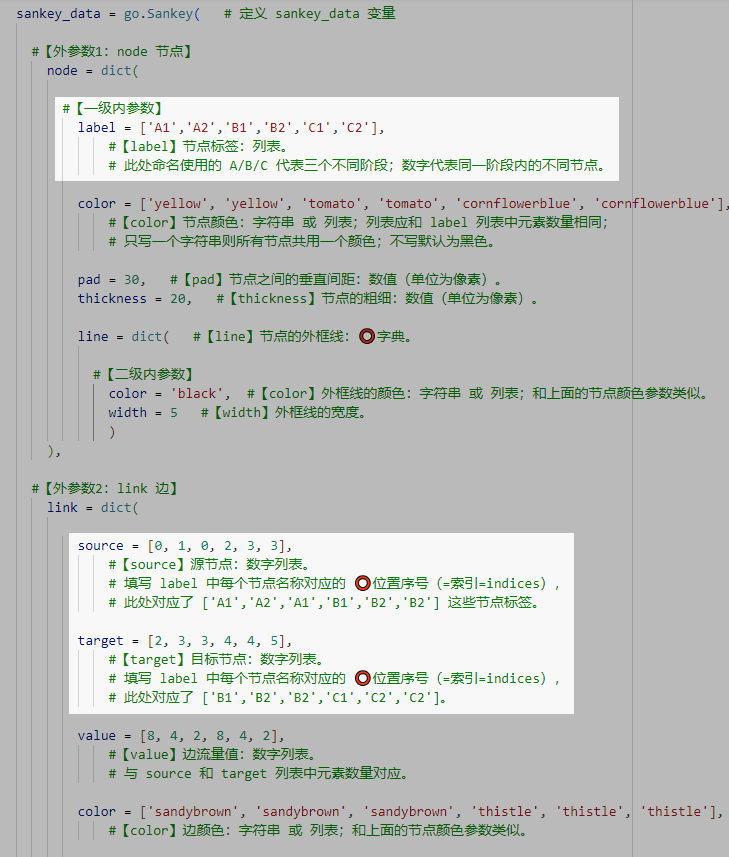

*Figure 1.5-2. 两个参数 需要输入 节点标签的 index*

**然而 index 并不方便记忆，为了方便记忆与检查，我们可以这样操作：**

In [9]:
#【1】创建一个列表变量，储存将来用于填入 label 参数的列表
node_names = ["A1", "A2", "B1", "B2", "C1", "C2"]  # 节点名称

#【2】创建一个变量，储存【1】中创建的列表中，每个元素的 index
node_ids = range(len(node_names))

    #【内函数：len()】
    # 获取列表 node_names 的元素数量，一共有六个元素，所以 len(node_names) = 6

    #【外函数：range()】
    # 其语法为：range(起始值,终止值,步长)。
    # 得到一个从 起始值(包含)到 终止值(不包含)，按照步长 以此递增/递减(步长为负则递减) 的数字序列。
    # 只写一个参数的话默认填写的是 终止值，且起始值默认为 0，步长默认为 1。
    # 例如：range(6) = [0, 1, 2, 3, 4, 5]，此处正好代表了 node_names 中的 index。
    # 注：range() 返回的值严格来说并不是一个列表，而是一个可迭代 range 对象。


#【3】创建一个整合【1】和【2】的字典，让我们可以通过输入 节点名称 来查找对应的 index
nodes = dict(zip(node_names, node_ids))

In [10]:
# 通过上面三步操作，我们可以通过节点名称来查找节点对应的 index，方便记忆。
# 例如：查找 'B2' 节点的 index 
nodes["B2"]

#⭕注意：列表是有序的，有 index 顺序；而字典是无序的，没有 index 顺序，只能通过 key 值来查找。

3

**<span style='color:firebrick'>这样一来，我们就可以通过节点名称来填写 source 和 target 参数。如下图 Figure 1.5-3：</span>**

![Alternative Text][1733237631447]

[1733237631447]: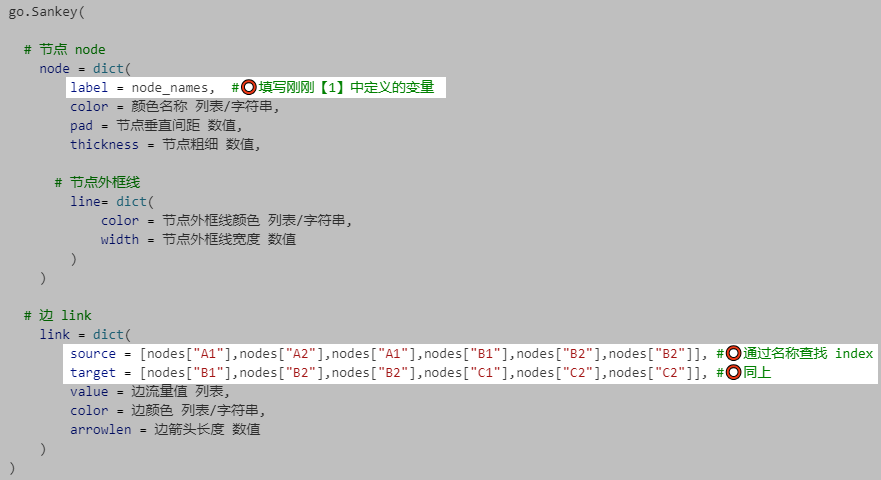

*Figure 1.5-3. 通过 节点名称 查找 节点标签的 index 并填入两个参数*

**但是，对于 `source`, `target`, `label` 等内容很长的参数，如果画图时手动输入所有内容，很不方便。因此我们可以 <span style='color:firebrick'>定义一些变量</span> 来储存这些要输入的内容，操作如下：**

In [11]:
#【第一步：定义变量储存每个参数的内容】

# 在上文中我们已经定义了 node_names 变量，直接可以用于填入 label 参数

# 定义一个储存节点颜色的变量
node_colors = ['yellow','yellow','tomato','tomato','cornflowerblue','cornflowerblue']

#⭕定义一个字典变量，储存所有要填写的内外参数和对应的内容，该字典中的 key 为 
# plotly 预设的参数名称，value 为我们要输入的内容。
node_definition = dict(
    pad = 15, 
	thickness = 20, 
	line = dict(color='black', width=5), #⭕color 和 width 也是 Plotly 预设参数
	label = node_names, #⭕填入上文定义的 储存节点名称的 变量
    color = node_colors, #⭕填入刚刚定义的 储存节点颜色的 变量
)

# 同理，定义一些变量用于储存 链接 link 参数需要用到的内容
sources = [nodes['A1'],nodes['A1'],nodes['A2'],nodes['B1'],nodes['B2'],nodes['B2']]
targets = [nodes['B1'],nodes['B2'],nodes['B2'],nodes['C1'],nodes['C1'],nodes['C2']]
values = [8, 4, 2, 8, 4, 2]
link_colors = ['sandybrown','sandybrown','sandybrown',
                'thistle','thistle','thistle'] # 链接颜色数量应当和链接数量相同

#⭕所有要填入链接 link 外参数的内容
link_definition = dict(
    source = sources,  #⭕填入变量，下同。
	target = targets, 
	value = values,
	color = link_colors,
	arrowlen = 15,
)

In [12]:
#【第二步：把定义好的变量填入函数】

fig = go.Figure(
    go.Sankey(
        node=node_definition, 
        link=link_definition,
    )
)

# 调整图片
fig.update_layout(
  #【设置图片大小】
    width=600, height=400,  
  #【设置图片标题】  
    title_text="Figure 1.5-4. 示例桑基图 - 重绘版",
    title_x=0.5, title_y=0.1,
    font={'style':'italic'},  # 这也是一个嵌套字典
) 

fig.show(renderer='notebook')

**这样我们就通过定义变量并填入函数中的参数，重新绘制了和上文一样的桑基图，见 Figure 1.5-1 和 Figure 1.5-4。**

**<span style='color:firebrick'>这样做的好处是可以让代码更清晰、可维护，并且可以方便地修改参数来重绘不同的数据。</span>**

**除此之外，我们还可以修改链接颜色的【透明度】。**

**方法：** 使用 RGBA 值来定义颜色，而不是通过名称字符串来调取颜色。

**RGBA 值格式：** (red, green, blue, alpha)。其中 alpha 值表示透明度，0 为完全透明，1 为完全不透明。

上文中绘制的桑基图使用的链接颜色分别是 'sandybrown' 和 'thistle'（css预设颜色名称，通过 plotly 库 和 matplotlib 库均可调取）。  

**相关链接：**   
>[w3schools - CSS Colors](https://www.w3schools.com/cssref/css_colors.php)  
>[Matplotlib - CSS Colors](https://matplotlib.org/stable/gallery/color/named_colors.html)

In [13]:
import matplotlib.colors as c  # 引入 matplotlib.colors 模块，用于处理 RGBA 值

In [14]:
# 查找 'sandybrown' 颜色的 RGB 值，并将 alpha 值设为 0.5
c.to_rgba('sandybrown', 0.5)

(0.9568627450980393, 0.6431372549019608, 0.3764705882352941, 0.5)

In [15]:
# 定义一个变量储存 'sandybrown' 颜色的 RGBA 值
faint_sandybrown='rgba'+str(c.to_rgba('sandybrown',0.5)) # 加号用于连接两个字符串

print(faint_sandybrown)

rgba(0.9568627450980393, 0.6431372549019608, 0.3764705882352941, 0.5)


In [16]:
# 同理，定义一个变量储存 'thistle' 颜色的 RGBA 值
faint_thistle='rgba'+str(c.to_rgba('thistle', 0.5)) 

print(faint_thistle)

rgba(0.8470588235294118, 0.7490196078431373, 0.8470588235294118, 0.5)


In [17]:
link_colors  # 查看原来的 link_colors 变量

['sandybrown', 'sandybrown', 'sandybrown', 'thistle', 'thistle', 'thistle']

In [18]:
# 修改 link_colors 变量，使得 'sandybrown' 和 'thistle' 链接的颜色都有 50% 的不透明度
link_colors = [faint_sandybrown, faint_sandybrown, faint_sandybrown, 
                faint_thistle, faint_thistle, faint_thistle]

In [38]:
fig.update_traces(link_color = link_colors)  #⭕更新 link_colors 变量

# 调整图片
fig.update_layout(
  #【设置图片大小】
    width=600, height=400,  
  #【设置图片标题】  
    title_text="Figure 1.5-5. 示例桑基图 - 链接透明度 50%",
    title_x=0.5, title_y=0.1,
    font={'style':'italic'},  
) 

fig.show(renderer='notebook')

**<h1 id="2-网络图-network-diagram">2. 网络图 Network Diagram</h1>**

**<h2 id="2.1-网络图和桑基图的异同">2.1 网络图和桑基图的异同</h2>**

桑基图和网络图都是可视化数据关系的有力工具，但它们有不同的特点和用途： 

**桑基图（Sankey Diagram）**：

* 目的：主要用于展示节点之间流动或转移的数据量。

* **节点（node）：** 代表流程中的不同阶段或实体，比如一个工厂，或者第一阶段。

* **链接（link）：** 表示资源在节点之间的流动，通常是有向的，从源节点指向目标节点。【链接宽度表示流量大小】

* 关键特征：层级化，强调资源的流动、方向、发散、收敛等。

* 例子：展示一个系统的能量分布和转移，不同阶段的成本或资源分配，等等。

**网络图（Network Diagram）**：

* 目的：主要用于展示节点之间的连接或关系。

* **节点（node 或 vertex，复数 vertices）：** 代表个体，比如一个人。

* **边（edge）：** 表示实体之间的关系或连接。【边没有宽度区分】

* 关键特征：强调节点之间的直接或间接连接，以及它们之间的关系强度或距离。

* 例子：社交网络分析，交通或物流网络的可视化，计算机网络拓扑结构，等等。

**<h2 id="2.2-绘制网络图">2.2 绘制网络图</h2>**

引入库之前先用 `pip install pyvis` 安装 pyvis 模块 (包含 networkx)。  
（可以用  `pip install pyvis --quiet` 指令让它在后台下载）  

使用用本地软件 (jupyter notebook) 的话，会直接安装在本地，以后可以直接引用库；  
使用在线环境（google colab）的话，会保存在当前 ipynb 文件的 虚拟环境 中。

**<p style='color:firebrick'>安装到虚拟环境中的 pyvis 模块，只能在当前 ipynb 文件中使用，如果在 colab 中打开另一个 ipynb 文件，则需要重新安装 pyvis 库。</p>**

In [20]:
# 引入库，用于绘制网络图
from pyvis.network import Network
import networkx as nx

**第一步：利用 networkx 库来创建网络关系**

In [21]:
# 创建一个（边无向的）空网络。也可以用 gx=nx.MultiDiGraph() 创建一个 边有向 的空网络。
gx = nx.Graph()  

In [22]:
# 向空网络 gx 中添加节点和边
gx.add_edge('a','b') # 向 gx 中添加从节点 'a' 指向节点 'b' 的边，下同。
gx.add_edge('b','d')
gx.add_edge('c','e')
gx.add_edge('e','a')
gx.add_edge('c','d')

**第二步：利用 pyvis 库来输出可交互网络图**

In [23]:
gp = Network()  # 用 pyvis Network() 函数创建一个空的可交互网络图对象

In [24]:
gp.from_nx(gx)  # 把第一步中创建的网络 gx 存入 网络图 gp

In [25]:
# 输出网络图为一个单独的 html 文件。
gp.show('network.html', notebook=False)  # 注意要写 notebook=False

network.html


注意，输出的 html 文件不会自动弹窗打开，也不会显示在 output 里，而是自动储存在 colab-文件 中，如下图 Figure 2.2-2：

![Alternative Text][1733419121758]


[1733419121758]: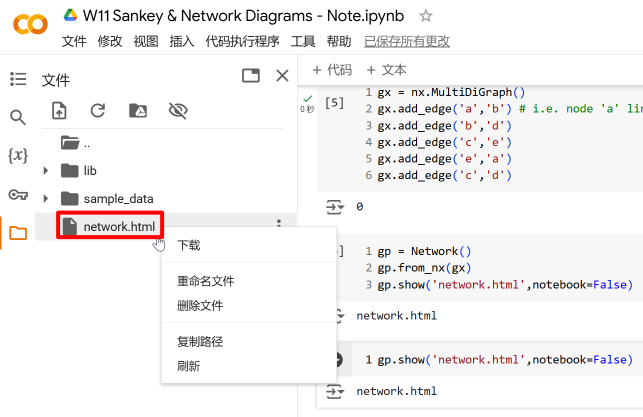

*Figure 2.2-2. 输出的 html 文件自动储存在 colab-文件 中*

下载 network.html 文件后，再用浏览器打开查看，效果如下图 Figure 2.2-3 所示：

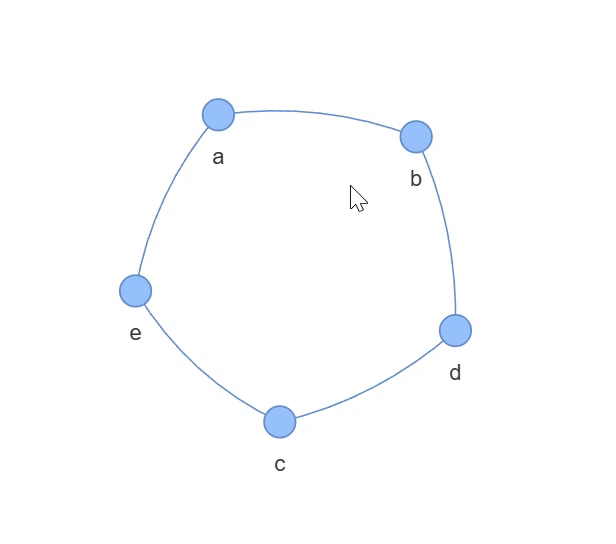

*Figure 2.2-3. 网络图 html 输出结果演示（gif动图）*

In [26]:
print(gp.nodes[0]) # 查看 网络图 中的第一个（index为0）节点的信息

{'color': '#97c2fc', 'size': 10, 'id': 'a', 'label': 'a', 'shape': 'dot'}


**我们还可以手动更改网络图中的节点颜色、大小等信息，方法如下：**

In [27]:
# 修改节点信息
gp.nodes[0]['color'] = 'red'
gp.nodes[0]['size'] = 20

In [28]:
# 重新输出修改后的网络图，输出文件打开后效果如下图 Figure 2.2-4
gp.show('network1.html', notebook=False)  

#⭕注意：为了和原图区分，命名为 network1.html
# 如果还写 network.html，将会覆盖原来的 network.html 文件。

network1.html


![Alternative Text][1733419812638]

[1733419812638]: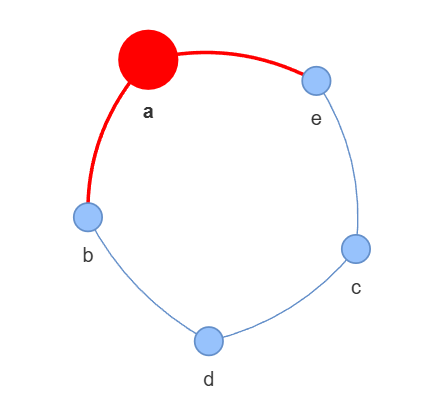

*Figure 2.2-4. 修改后的网络图*

**<h2 id="2.3-直接从文件中读取网络关系">2.3 直接从文件中读取网络关系</h2>**

**除了手动通过 networkx 库来创建和操作网络，还可以直接从 CSV 文件中读取网络关系数据。**

比如 beer and curry 文件中储存了 推文数据，其中有的帖子艾特了其他用户，这个关系可以看成从 原贴主（节点1）指向 被艾特的人（节点2）的关系。

In [29]:
import pandas as pd  # 引入 pandas 库

In [30]:
# 定义文件路径（beer and curry）
path = 'E:/OneDrive - The University of Liverpool/Study/UoL/Year 3/S1 COMM327 Data Science and Visualisation/W11 Sankey & Network Diagrams/Files/beer AND curry.csv'

In [31]:
df = pd.read_csv(path)  # 读取 CSV 文件

In [32]:
# 只保留有连接的节点，去除没有艾特别人的帖子
df.dropna(subset='mentions',inplace=True)  
# 删除在 'mentions' 列中所有包含空值的行。inplace=True 表示保存修改并替换原来的df。

In [33]:
# 新建一个空网络用于储存 beer and curry 网络
gx1 = nx.MultiDiGraph()

In [34]:
# 定义一个循环，用于向空网络中添加所有节点和边

for i in df.index: # go through each tweet with connected nodes (df.index是df的所有index)
	user = df.loc[i, 'user'] # source node ()
	mentions = df.loc[i, 'mentions'] # target node(s) as a single string
	mentions = mentions.replace(' ','') # remove blank characters
	mentions = mentions.split('@') # list of target node(s)
	mentions.pop(0) # first entry is blank due to the method used
	for mention in mentions:
		gx1.add_edge(user, mention)

In [35]:
gp1 = Network() # 新建一个空网络图

In [36]:
gp1.from_nx(gx1) # 把 gx1 的 网络数据 存入 gp1

In [37]:
# 输出 html 文件
gp1.show('network2.html', notebook=False)  # 命名为 network2.html

network2.html


输出的网络图比较复杂，需要 1~2 分钟时间渲染，渲染过程中不要关闭浏览器。渲染成功后如下 Figure 2.3-1、Figure 2.3-2：

![Alternative Text][1733423298431]

[1733423298431]: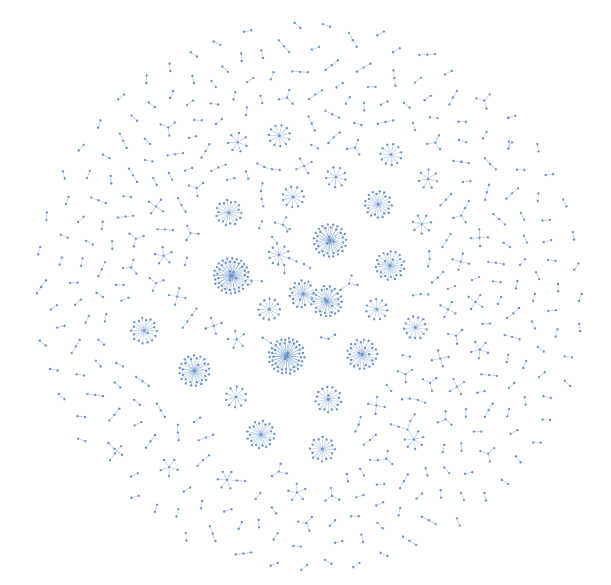

*Figure 2.3-1. 社交网络图：整体预览*

![Alternative Text][1733423498235]

[1733423498235]: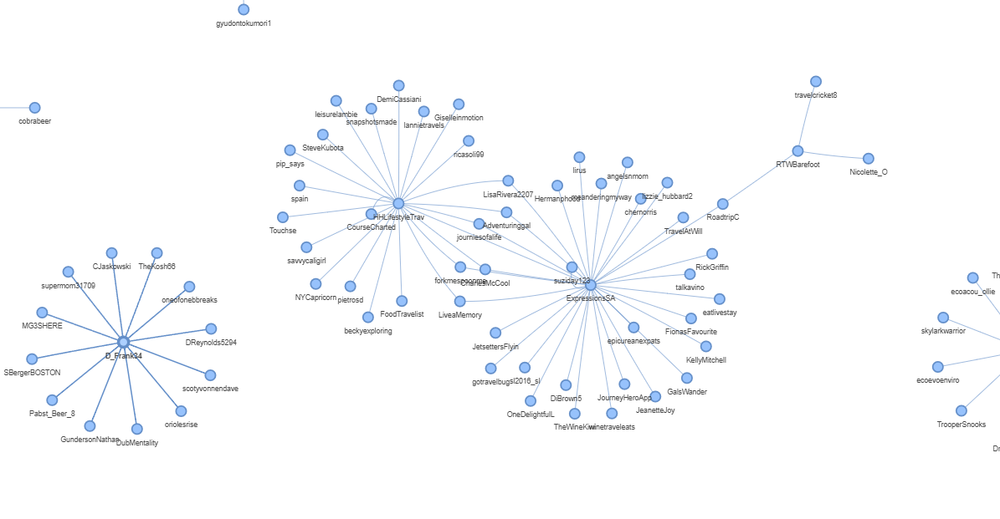

*Figure 2.3-2. 社交网络：细节预览*

**由此可见，网络图可以用于研究社交网络，发现人际间的 强连接 和 弱连接、影响力高/低 的用户；分析潜在 信息茧房 和 echo chamber。**